# Testing coherence across 10-days or so for different time series

In [1]:
# Setting up environment
import sys
import pandas as pd
sys.path.append("../../../xapres_package/")
import ApRESDefs
import numpy as np
import matplotlib.pyplot as plt
import xarray as xr
import importlib
import gcsfs
import math

importlib.reload(ApRESDefs)
xa = ApRESDefs.xapres(loglevel='debug')

DEBUG    14:04:16 	 ApRESDefs.py @function _setup_logging line 615 - Stream logging level set to DEBUG
DEBUG    14:04:16 	 ApRESDefs.py @function _setup_logging line 616 - Add console handler to logger
DEBUG    14:04:16 	 ApRESDefs.py @function _setup_logging line 629 - File logging level set to DEBUG


In [2]:
from dask.distributed import Client

client = Client("tcp://127.0.0.1:36319")
client

<Client: 'tcp://127.0.0.1:36319' processes=4 threads=16, memory=125.81 GiB>

## Generate coherence over different seasons at A101
Starting with summer (outside of lake drainage)

In [3]:
def reload(site):
    filename = f'gs://ldeo-glaciology/apres/greenland/2022/single_zarrs_noencode/{site}'
    ds = xr.open_dataset(filename,
        engine='zarr', 
        consolidated=True, 
        chunks={}) 
    return ds
ds_101 = reload("A101").isel(attenuator_setting_pair=1,time=range(2000,3000)).compute()


Text(0.5, 0, 'date')

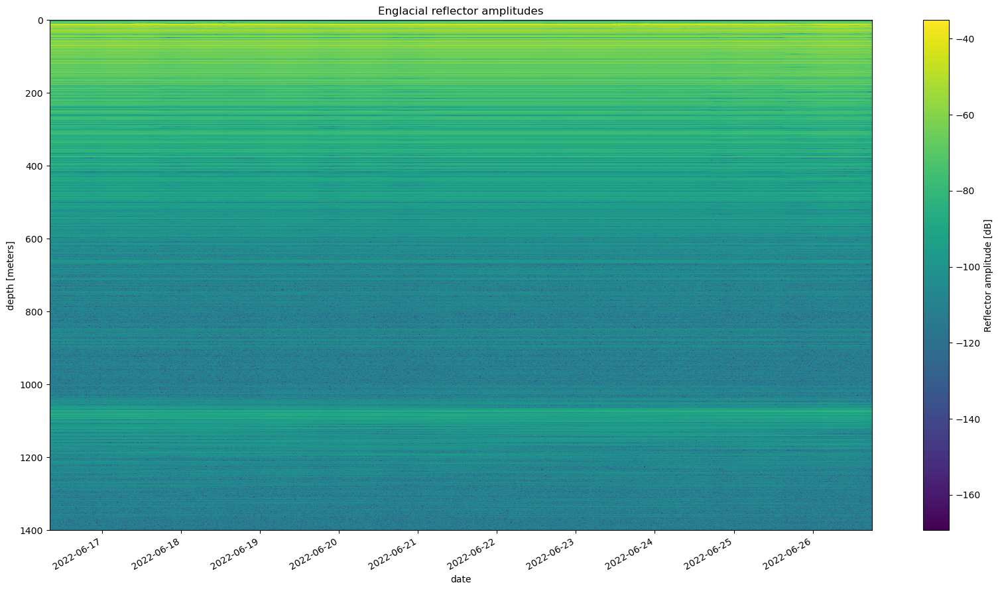

In [4]:
fig, ax = plt.subplots(figsize=(20,10))
xa.dB(ds_101.profile_stacked).plot(ax=ax,x='time',cbar_kwargs={'label':'Reflector amplitude [dB]'})
ax.invert_yaxis()
ax.set_title("Englacial reflector amplitudes")
plt.xlabel('date')


Data doesn't look too noisy, try doing analysis with profile_stacked

In [16]:
b1= ds_101.profile_stacked.isel(time=range(0,len(ds_101.profile_stacked)-1))
b2 = ds_101.profile_stacked.isel(time=range(1,len(ds_101.profile_stacked)))
b1_dupe = b1.copy()
for i in range(1,len(b1_dupe)):
    b1_dupe[i]= b1[0]

ds_b1, co_b1, phi_b1 = xa.generate_range_diff(b1_dupe,b2,80,80,None,0,0.95)

INFO     14:10:53 	 ApRESDefs.py @function generate_range_diff line 669 - Time between bursts : [900. 900. 900. 900. 900. 900. 900. 900. 893. 898. 928. 870. 900. 900.
 901. 899. 900. 900. 901. 900. 900. 904. 895. 903. 898. 911. 888. 900.
 901. 901. 899. 900. 927. 884. 899. 893. 898. 900. 901. 902. 899. 897.
 900. 910. 901. 917. 871. 900. 900. 900. 900. 900. 900. 900. 911. 905.
 887. 918. 908. 882. 901. 900. 899. 901. 901. 899. 901. 900. 900. 900.
 900. 900. 900. 900. 900. 900. 900. 900. 901. 899. 899. 920. 869. 900.
 901. 899. 900. 900. 900. 900. 900. 901. 899. 901. 899. 901. 899. 900.
 902. 899. 899. 900. 901. 927. 872. 900. 900. 901. 900. 900. 899. 900.
 900. 928. 872. 900. 901. 899. 901. 898. 901. 899. 911. 917. 883. 900.
 900. 900. 900. 892. 900. 899. 900. 900. 900. 927. 871. 900. 901. 900.
 900. 900. 900. 899. 902. 904. 899. 897. 899. 900. 901. 905. 894. 901.
 899. 900. 901. 899. 900. 908. 894. 900. 903. 897. 900. 900. 901. 909.
 893. 901. 922. 872. 900. 903. 900. 911. 889. 900. 9

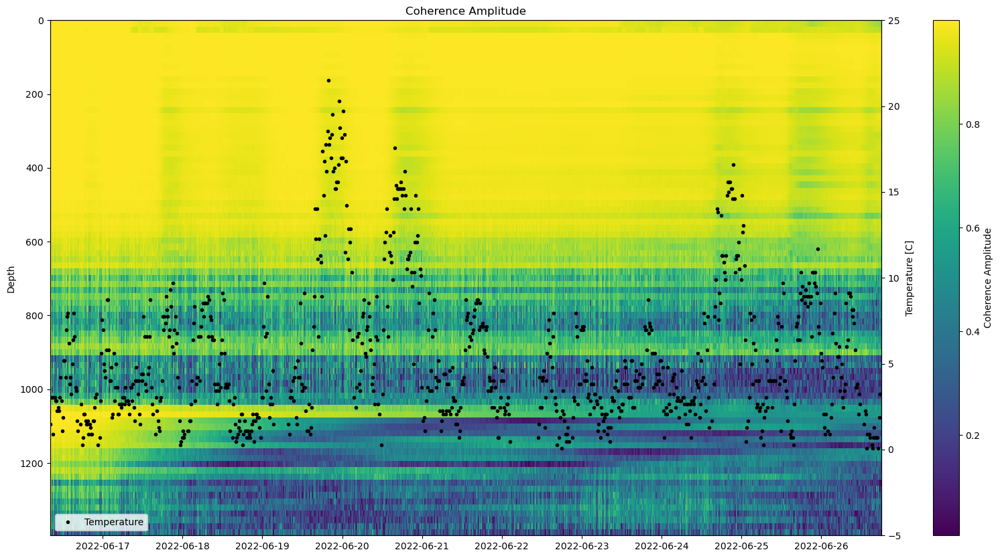

In [17]:
fig, ax = plt.subplots(figsize=(20,10))
temp = ds_101.temperature_2.isel(time=range(1,len(ds_101.temperature_2))).compute()
im = plt.pcolormesh(ds_b1.time,ds_b1.profile_range,abs(co_b1).transpose())
fig.colorbar(im,label='Coherence Amplitude')
ax.invert_yaxis()
ax2 = ax.twinx()
temp.plot(ax=ax2,color='black',linestyle='None',marker='.',label = 'Temperature')
ax2.set_ylabel('Temperature [C]')
ax2.set_title('')
ax2.set_ylim([-5,25])
ax.set_ylabel('Depth')
plt.xlabel('Date')
ax.set_title('Coherence Amplitude')
ax2.legend()

## Look at error distribution

In [18]:
b1= ds_101.profile_stacked.isel(time=range(0,len(ds_101.profile_stacked)-1))
b2 = ds_101.profile_stacked.isel(time=range(1,len(ds_101.profile_stacked)))
b1_dupe = b1.copy()
for i in range(1,len(b1_dupe)):
    b1_dupe[i]= b1[0]

ds_b1, co_b1, phi_b1 = xa.generate_range_diff(b1,b2,80,80,None,0,0.95)

INFO     14:11:14 	 ApRESDefs.py @function generate_range_diff line 669 - Time between bursts : [900. 900. 900. 900. 900. 900. 900. 900. 893. 898. 928. 870. 900. 900.
 901. 899. 900. 900. 901. 900. 900. 904. 895. 903. 898. 911. 888. 900.
 901. 901. 899. 900. 927. 884. 899. 893. 898. 900. 901. 902. 899. 897.
 900. 910. 901. 917. 871. 900. 900. 900. 900. 900. 900. 900. 911. 905.
 887. 918. 908. 882. 901. 900. 899. 901. 901. 899. 901. 900. 900. 900.
 900. 900. 900. 900. 900. 900. 900. 900. 901. 899. 899. 920. 869. 900.
 901. 899. 900. 900. 900. 900. 900. 901. 899. 901. 899. 901. 899. 900.
 902. 899. 899. 900. 901. 927. 872. 900. 900. 901. 900. 900. 899. 900.
 900. 928. 872. 900. 901. 899. 901. 898. 901. 899. 911. 917. 883. 900.
 900. 900. 900. 892. 900. 899. 900. 900. 900. 927. 871. 900. 901. 900.
 900. 900. 900. 899. 902. 904. 899. 897. 899. 900. 901. 905. 894. 901.
 899. 900. 901. 899. 900. 908. 894. 900. 903. 897. 900. 900. 901. 909.
 893. 901. 922. 872. 900. 903. 900. 911. 889. 900. 9

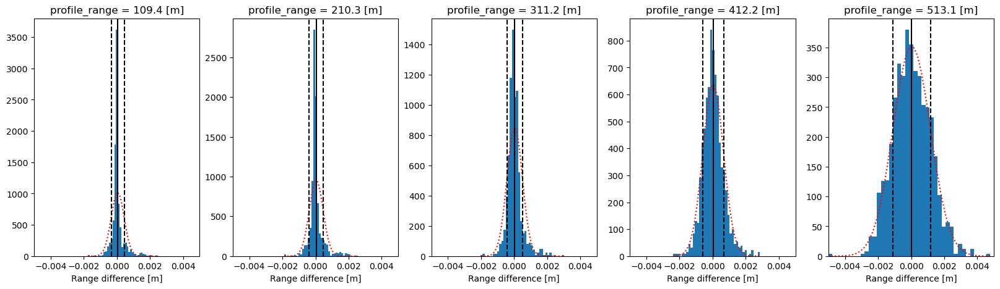

In [21]:
fig, axs = plt.subplots(ncols = 5,figsize=(20,5))
for i in range(5):
    data = ds_b1.range_diff.isel(profile_range=6*(i+1))
    mu = data.mean().values
    sigma = data.std().values
    n, bins, patches = data.plot.hist(ax = axs[i],bins=40,density=True)
    y = ((1 / (np.sqrt(2 * np.pi) * sigma)) * np.exp(-0.5 * (1 / sigma * (bins - mu))**2))
    axs[i].plot(bins, y, ':',color='r')
    axs[i].axvline(mu,linestyle='-',color='k')
    axs[i].axvline(mu-sigma,linestyle='--',color='k')
    axs[i].axvline(mu+sigma,linestyle='--',color='k')
    axs[i].set_xlim([-0.005,0.005])
    #axs[i].set_ylim([0,800])
#ds_b1.range_diff.isel(profile_range=50).plot.hist(bins=10)

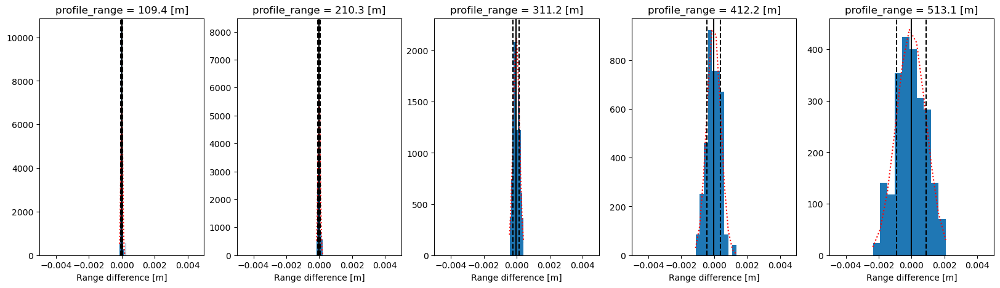

In [23]:
fig, axs = plt.subplots(ncols = 5,figsize=(20,5))
for i in range(5):
    data = ds_b1.range_diff.isel(time=range(500,596),profile_range=6*(i+1))
    mu = data.mean().values
    sigma = data.std().values
    n, bins, patches = data.plot.hist(ax = axs[i],bins=10,density=True)
    y = ((1 / (np.sqrt(2 * np.pi) * sigma)) * np.exp(-0.5 * (1 / sigma * (bins - mu))**2))
    axs[i].plot(bins, y, ':',color='r')
    axs[i].axvline(mu,linestyle='-',color='k')
    axs[i].axvline(mu-sigma,linestyle='--',color='k')
    axs[i].axvline(mu+sigma,linestyle='--',color='k')
    axs[i].set_xlim([-0.005,0.005])
    #axs[i].set_ylim([0,800])
#ds_b1.range_diff.isel(profile_range=50).plot.hist(bins=10)

(0.0, 0.001)

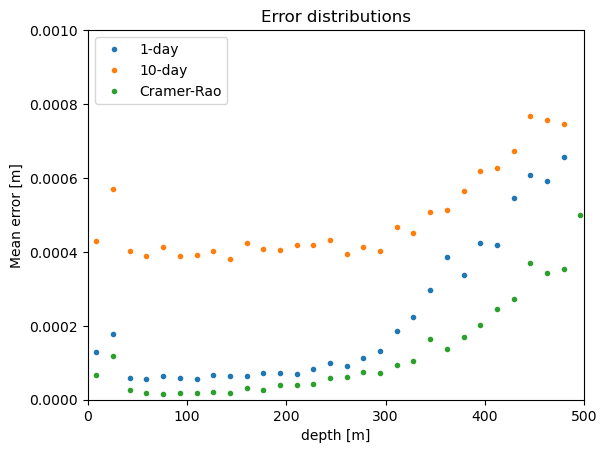

In [71]:
# Try looking at error
day_mean = ds_b1.isel(time=range(500,596)).range_diff.mean(dim='time')
day_error =  ds_b1.isel(time=range(500,596)).range_diff.std(dim='time')
plt.plot(day_mean.profile_range,day_error,linestyle='None',marker='.',label='1-day')

# Try looking at error
tenday_mean = ds_b1.range_diff.mean(dim='time')
tenday_error =  ds_b1.range_diff.std(dim='time')
plt.plot(tenday_mean.profile_range,tenday_error,linestyle='None',marker='.',label='10-day')

mean_obs = ds_b1.err.mean(dim='time')
plt.plot(tenday_mean.profile_range,mean_obs,linestyle='None',marker='.',label='Cramer-Rao')

plt.legend()
plt.ylabel('Mean error [m]')
plt.xlabel('depth [m]')
plt.title('Error distributions')
plt.xlim([0,500])

plt.ylim([0,1e-3])

INFO     14:25:00 	 ApRESDefs.py @function generate_range_diff line 669 - Time between bursts : [8991. 8999. 9001. 9003. 8995. 9011. 9002. 9000. 8988. 9001. 9000. 8998.
 9003. 8998. 9000. 9008. 8998. 8997. 9001. 9025. 8972. 9000. 9000. 9013.
 8988. 9001. 9011. 8988. 9026. 8975. 9008. 8994. 8996. 9001. 9001. 9001.
 8998. 9002. 9002. 8998. 8999. 9002. 8999. 8999. 9008. 8991. 9002. 9012.
 8988. 9006. 8993. 9001. 9000. 9006. 8995. 9001. 8998. 9019. 8982. 9005.
 8996. 8999. 9014. 8999. 9001. 8999. 9000. 8988. 9000. 9001. 9022. 8979.
 8999. 9018. 8982. 9000. 9000. 9013. 8987. 9021. 8989. 8991. 9002. 8999.
 9019. 8982. 8998. 9020. 8982. 8999. 9006. 8993. 9009. 8993. 9011. 8989.
 9007. 9002. 8993.]s
INFO     14:25:00 	 ApRESDefs.py @function generate_range_diff line 669 - Time between bursts : [891002.]s


INFO     15:15:47 	 ApRESDefs.py @function generate_range_diff line 669 - Time between bursts : [900. 900. 900. 900. 900. 900. 900. 900. 893. 898. 928. 870. 900. 900.
 901. 899. 900. 900. 901. 900. 900. 904. 895. 903. 898. 911. 888. 900.
 901. 901. 899. 900. 927. 884. 899. 893. 898. 900. 901. 902. 899. 897.
 900. 910. 901. 917. 871. 900. 900. 900. 900. 900. 900. 900. 911. 905.
 887. 918. 908. 882. 901. 900. 899. 901. 901. 899. 901. 900. 900. 900.
 900. 900. 900. 900. 900. 900. 900. 900. 901. 899. 899. 920. 869. 900.
 901. 899. 900. 900. 900. 900. 900. 901. 899. 901. 899. 901. 899. 900.
 902. 899. 899. 900. 901. 927. 872. 900. 900. 901. 900. 900. 899. 900.
 900. 928. 872. 900. 901. 899. 901. 898. 901. 899. 911. 917. 883. 900.
 900. 900. 900. 892. 900. 899. 900. 900. 900. 927. 871. 900. 901. 900.
 900. 900. 900. 899. 902. 904. 899. 897. 899. 900. 901. 905. 894. 901.
 899. 900. 901. 899. 900. 908. 894. 900. 903. 897. 900. 900. 901. 909.
 893. 901. 922. 872. 900. 903. 900. 911. 889. 900. 9

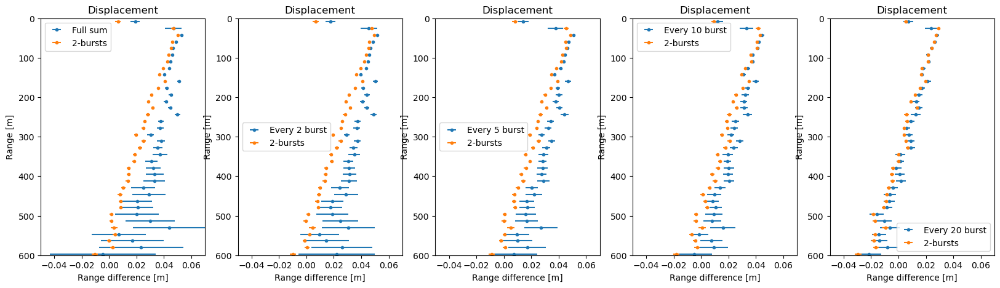

In [73]:
def plot_err(ax,displacement_ds,err,label):
    ax.errorbar(displacement_ds,displacement_ds.profile_range,yerr=None,xerr=err,linestyle='None',marker='.',label=label)
    ax.set_ylim([0,600])
    ax.invert_yaxis()
    ax.set_xlabel('Range difference [m]')
    ax.set_ylabel('Range [m]')
    ax.set_title('Displacement')
    ax.set_xlim([-0.05,0.07])
    ax.legend()

fig, ax = plt.subplots(ncols = 5,figsize=(20,5))
# minimizing error
window = 80
resample = ds_101.profile_stacked
b1= resample.isel(time=range(0,len(resample)-1))
b2 = resample.isel(time=range(1,len(resample)))
ds_full, co_full, phi_full = xa.generate_range_diff(b1,b2,window,window,None,0,0.95)
ds, co, phi = xa.generate_range_diff(b1.isel(time=[0]),b2.isel(time=[-1]),window,window,None,0,0.95)
total_displacement = ds_full.range_diff.sum(dim='time')
total_errs = np.sqrt((ds_full.err**2).sum(dim='time'))
plot_err(ax[0],total_displacement,total_errs,'Full sum')
plot_err(ax[0],ds.range_diff.isel(time=0),ds.err.isel(time=0),'2-bursts')

for i,j in zip([2,5,10,20],range(1,5)):
    resample = ds_101.profile_stacked.isel(time=range(0,len(ds_101.profile_stacked),i))
    b1= resample.isel(time=range(0,len(resample)-1))
    b2 = resample.isel(time=range(1,len(resample)))
    print(b2.time[-1].values)
    ds_full, co_full, phi_full = xa.generate_range_diff(b1,b2,window,window,None,0,0.95)
    ds, co, phi = xa.generate_range_diff(b1.isel(time=[0]),b2.isel(time=[-1]),window,window,None,0,0.95)
    total_displacement = ds_full.range_diff.sum(dim='time')
    total_errs = np.sqrt((ds_full.err**2).sum(dim='time'))
    plot_err(ax[j],total_displacement,total_errs,f'Every {i} burst')
    plot_err(ax[j],ds.range_diff.isel(time=0),ds.err.isel(time=0),'2-bursts')



Text(0.5, 0, 'date')

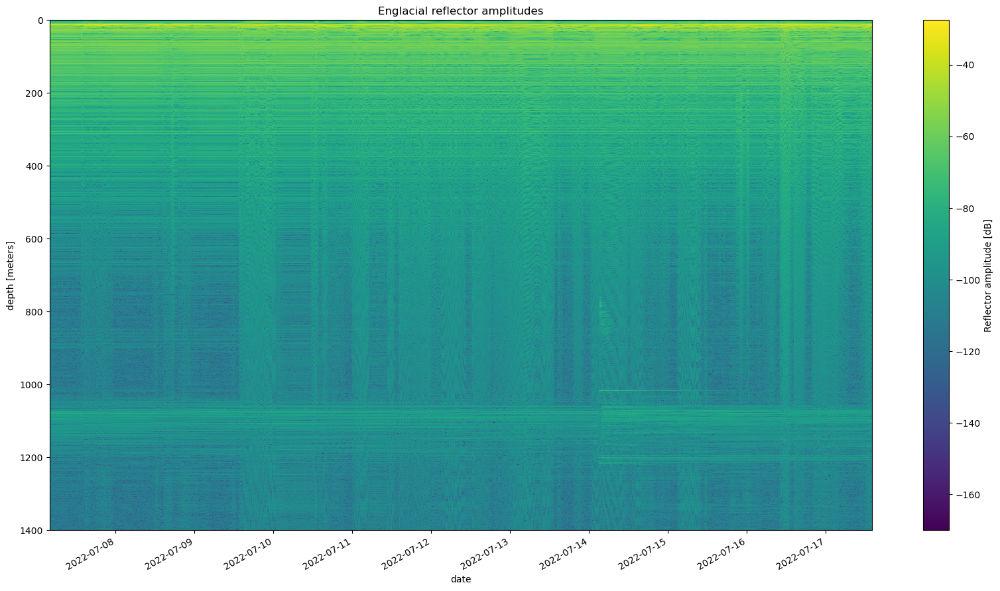

In [7]:
# Now let's try with lake drainage
ds_101 = reload("A101").isel(attenuator_setting_pair=1,time=range(4000,5000)).compute()
fig, ax = plt.subplots(figsize=(20,10))
xa.dB(ds_101.profile_stacked).plot(ax=ax,x='time',cbar_kwargs={'label':'Reflector amplitude [dB]'})
ax.invert_yaxis()
ax.set_title("Englacial reflector amplitudes")
plt.xlabel('date')


In [8]:
b1= ds_101.profile_stacked.isel(time=range(0,len(ds_101.profile_stacked)-1))
b2 = ds_101.profile_stacked.isel(time=range(1,len(ds_101.profile_stacked)))
b1_dupe = b1.copy()
for i in range(1,len(b1_dupe)):
    b1_dupe[i]= b1[0]

ds_b1, co_b1, phi_b1 = xa.generate_range_diff(b1_dupe,b2,20,20,None,0,0.95)

INFO     14:20:57 	 ApRESDefs.py @function generate_range_diff line 669 - Time between bursts : [891. 900. 899. 918. 888. 895. 900. 909. 891. 900. 900. 900. 905. 898.
 897. 911. 899. 923. 865. 900. 900. 902. 900. 899. 901. 899. 900. 900.
 900. 901. 900. 899. 900. 901. 901. 904. 900. 904. 901. 899. 900. 900.
 910. 883. 898. 900. 909. 923. 867. 900. 900. 901. 909. 900. 892. 906.
 899. 897. 900. 899. 910. 897. 923. 877. 900. 900. 900. 900. 900. 900.
 900. 900. 900. 908. 915. 866. 901. 900. 899. 900. 900. 900. 904. 896.
 901. 910. 890. 901. 910. 922. 867. 901. 900. 899. 901. 900. 899. 901.
 901. 900. 899. 900. 899. 900. 901. 899. 900. 901. 900. 900. 900. 899.
 901. 900. 900. 900. 900. 900. 900. 900. 900. 903. 897. 903. 897. 907.
 893. 901. 908. 924. 865. 903. 899. 899. 903. 907. 900. 900. 897. 895.
 899. 900. 900. 932. 877. 900. 900. 900. 900. 907. 893. 900. 900. 900.
 900. 900. 911. 897. 915. 866. 901. 900. 899. 900. 900. 901. 910. 900.
 900. 914. 904. 906. 865. 900. 900. 900. 901. 900. 9

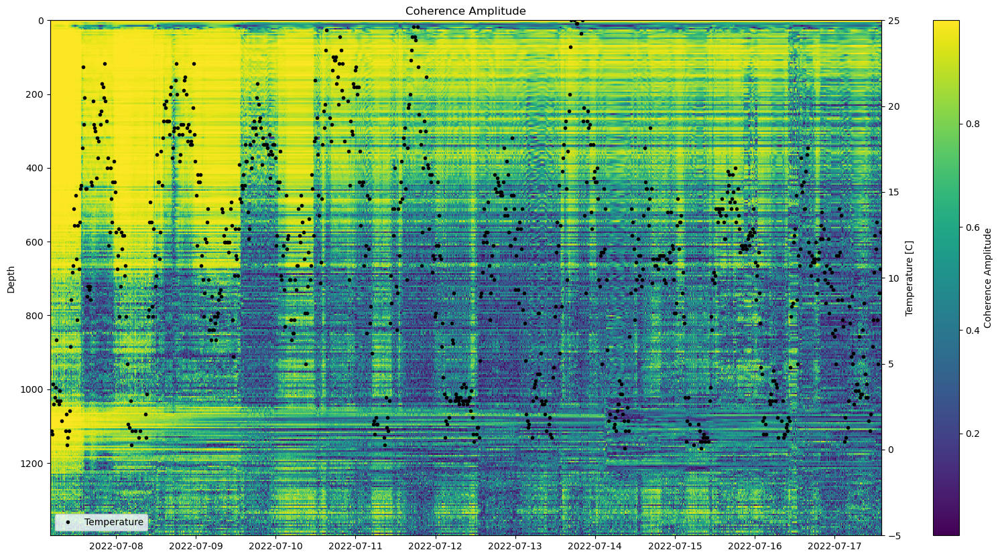

In [9]:
fig, ax = plt.subplots(figsize=(20,10))
temp = ds_101.temperature_2.isel(time=range(1,len(ds_101.temperature_2))).compute()
im = plt.pcolormesh(ds_b1.time,ds_b1.profile_range,abs(co_b1).transpose())
fig.colorbar(im,label='Coherence Amplitude')
ax.invert_yaxis()
ax2 = ax.twinx()
temp.plot(ax=ax2,color='black',linestyle='None',marker='.',label = 'Temperature')
ax2.set_ylabel('Temperature [C]')
ax2.set_title('')
ax2.set_ylim([-5,25])
ax.set_ylabel('Depth')
plt.xlabel('Date')
ax.set_title('Coherence Amplitude')
ax2.legend()

Clipping makes the coherence quite bad. Try applying half chirp window

In [10]:
# define function
def custom_stacked_profile_series(chirps,pad=2,F0=2e8,F1=4e8):
    StartFreq = 2e8
    StopFreq = 4e8
    B = StopFreq - StartFreq
    CentreFreq = B/2
    K = 2e8 
    dt = 1/40000
    c0 = 3e8 # speed of light in vaccuum
    ER_ICE = 3.18
    T0 = (F0-StartFreq)/K
    T1 = (F1-StartFreq)/K

    chirps = chirps.isel(chirp_time=range(math.ceil(T0/dt),math.floor(T1/dt)+1)).mean(dim='chirp_num')
    window = np.blackman(len(chirps.chirp_time))
    win_chirps = chirps*window
    Nt = len(chirps.chirp_time)
    Nfft = math.floor(Nt*pad)
    bin2m = c0/(2.*(T1-T0)*pad*math.sqrt(ER_ICE)*K)
    profile_range = np.asarray([i for i in range(Nfft)]) * bin2m      
    profile_range = profile_range[0:math.floor(Nfft/2)-1]
    padchirp = np.zeros((len(chirps.time),Nfft))
    padchirp[:,0:math.floor(Nt/2)] = win_chirps.data[:,math.floor(Nt/2):-1]
    padchirp[:,-math.floor(Nt/2):] = win_chirps.data[:,0:math.floor(Nt/2)]
    p = np.fft.fft(padchirp,axis=1)/Nfft * math.sqrt(2*pad)
    profile = p[:,0:math.floor(Nfft/2)-1]
    m = np.asarray([i for i in range(profile.shape[1])])/pad
    phiref = 2*math.pi*CentreFreq*m/B - m * m * 2*math.pi * K/2/B**2
    profile_ref = profile * np.exp(phiref[np.newaxis,:]*(-1j))
    profile_range = np.asarray([i for i in range(Nfft)]) * bin2m      
    profile_range = profile_range[0:math.floor(Nfft/2)-1]
    n = np.argmin(profile_range<=1400)
    Range = profile_range[:n]
    Profile = profile_ref[:,:n]
    da = xr.DataArray(Profile,
                  dims=['time','profile_range'],
                  coords={'profile_range': Range,
                         'time': chirps.time.data})
    return da

Text(0.5, 0, 'date')

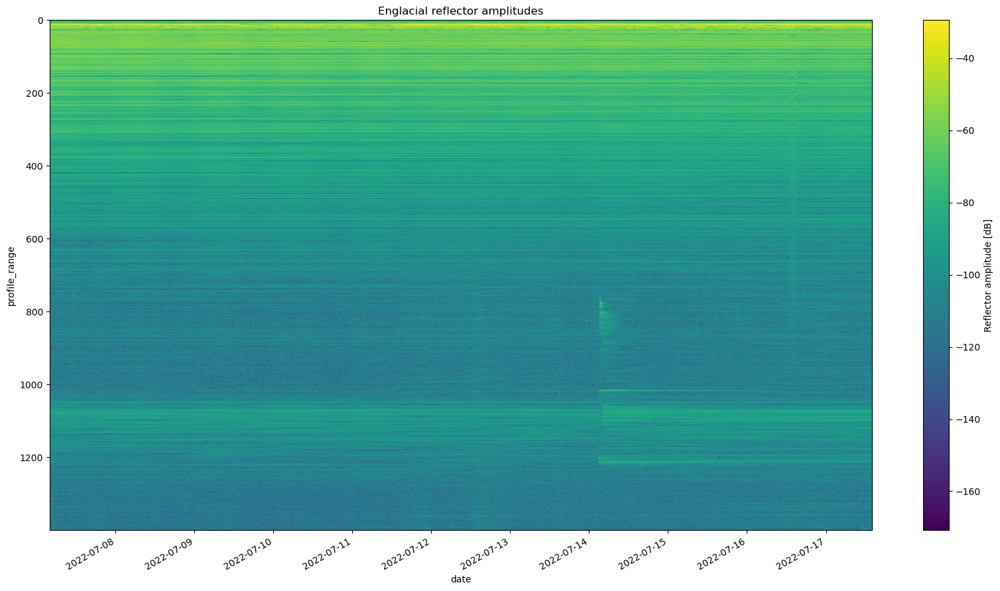

In [11]:
da_101_stacked  = custom_stacked_profile_series(ds_101.chirp,2,3e8,4e8)
fig, ax = plt.subplots(figsize=(20,10))
xa.dB(da_101_stacked).plot(ax=ax,x='time',cbar_kwargs={'label':'Reflector amplitude [dB]'})
ax.invert_yaxis()
ax.set_title("Englacial reflector amplitudes")
plt.xlabel('date')


In [12]:
b1= da_101_stacked.isel(time=range(0,len(da_101_stacked)-1))
b2 = da_101_stacked.isel(time=range(1,len(da_101_stacked)))
b1_dupe = b1.copy()
for i in range(1,len(b1_dupe)):
    b1_dupe[i]= b1[0]

ds_b1, co_b1, phi_b1 = xa.generate_range_diff(b1_dupe,b2,20,20,None,0,0.95)

INFO     14:21:08 	 ApRESDefs.py @function generate_range_diff line 669 - Time between bursts : [891. 900. 899. 918. 888. 895. 900. 909. 891. 900. 900. 900. 905. 898.
 897. 911. 899. 923. 865. 900. 900. 902. 900. 899. 901. 899. 900. 900.
 900. 901. 900. 899. 900. 901. 901. 904. 900. 904. 901. 899. 900. 900.
 910. 883. 898. 900. 909. 923. 867. 900. 900. 901. 909. 900. 892. 906.
 899. 897. 900. 899. 910. 897. 923. 877. 900. 900. 900. 900. 900. 900.
 900. 900. 900. 908. 915. 866. 901. 900. 899. 900. 900. 900. 904. 896.
 901. 910. 890. 901. 910. 922. 867. 901. 900. 899. 901. 900. 899. 901.
 901. 900. 899. 900. 899. 900. 901. 899. 900. 901. 900. 900. 900. 899.
 901. 900. 900. 900. 900. 900. 900. 900. 900. 903. 897. 903. 897. 907.
 893. 901. 908. 924. 865. 903. 899. 899. 903. 907. 900. 900. 897. 895.
 899. 900. 900. 932. 877. 900. 900. 900. 900. 907. 893. 900. 900. 900.
 900. 900. 911. 897. 915. 866. 901. 900. 899. 900. 900. 901. 910. 900.
 900. 914. 904. 906. 865. 900. 900. 900. 901. 900. 9

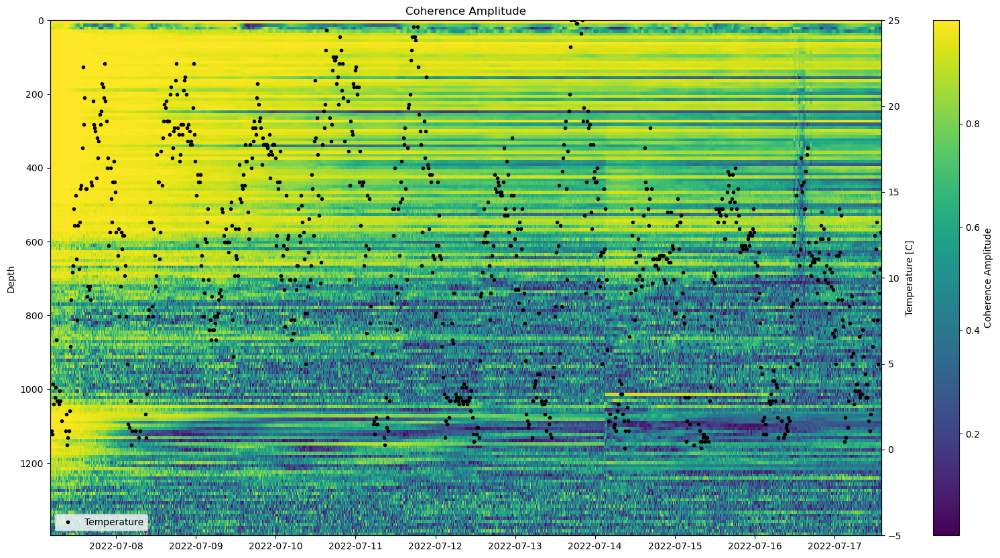

In [13]:
fig, ax = plt.subplots(figsize=(20,10))
temp = ds_101.temperature_2.isel(time=range(1,len(ds_101.temperature_2))).compute()
im = plt.pcolormesh(ds_b1.time,ds_b1.profile_range,abs(co_b1).transpose())
fig.colorbar(im,label='Coherence Amplitude')
ax.invert_yaxis()
ax2 = ax.twinx()
temp.plot(ax=ax2,color='black',linestyle='None',marker='.',label = 'Temperature')
ax2.set_ylabel('Temperature [C]')
ax2.set_title('')
ax2.set_ylim([-5,25])
ax.set_ylabel('Depth')
plt.xlabel('Date')
ax.set_title('Coherence Amplitude')
ax2.legend()

Text(0.5, 0, 'date')

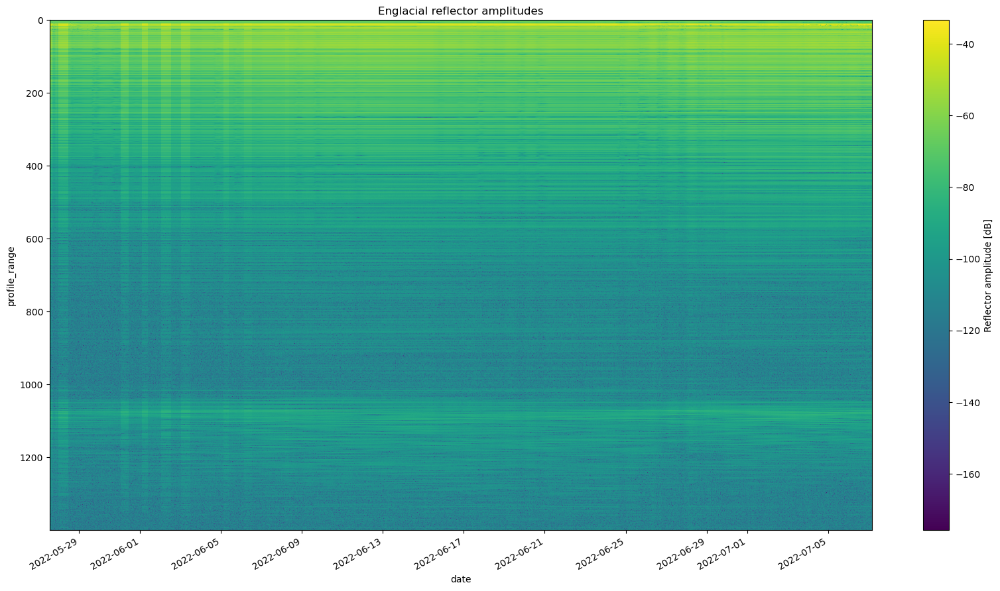

In [14]:
# now try longer series to see when in summer all coherence goes away
da_101_stacked  = custom_stacked_profile_series(reload("A101").chirp.isel(attenuator_setting_pair=1,time=range(100,4000)),2,3e8,4e8)
fig, ax = plt.subplots(figsize=(20,10))
xa.dB(da_101_stacked).plot(ax=ax,x='time',cbar_kwargs={'label':'Reflector amplitude [dB]'})
ax.invert_yaxis()
ax.set_title("Englacial reflector amplitudes")
plt.xlabel('date')



In [15]:
b1= da_101_stacked.isel(time=range(0,len(da_101_stacked)-1))
b2 = da_101_stacked.isel(time=range(1,len(da_101_stacked)))
b1_dupe = b1.copy()
for i in range(1,len(b1_dupe)):
    b1_dupe[i]= b1[0]

ds_b1, co_b1, phi_b1 = xa.generate_range_diff(b1_dupe,b2,20,20,None,0,0.95)

INFO     14:22:03 	 ApRESDefs.py @function generate_range_diff line 669 - Time between bursts : [901. 900. 901. ... 912. 892. 920.]s


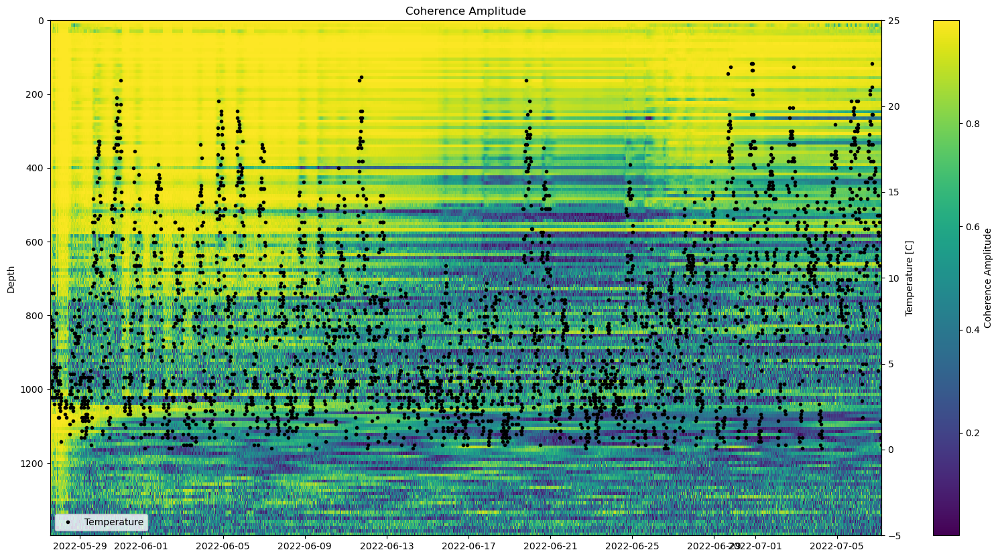

In [19]:
fig, ax = plt.subplots(figsize=(20,10))
temp = reload("A101").temperature_2.isel(time=range(100,4000)).compute()
im = plt.pcolormesh(ds_b1.time,ds_b1.profile_range,abs(co_b1).transpose())
fig.colorbar(im,label='Coherence Amplitude')
ax.invert_yaxis()
ax2 = ax.twinx()
temp.plot(ax=ax2,color='black',linestyle='None',marker='.',label = 'Temperature')
ax2.set_ylabel('Temperature [C]')
ax2.set_title('')
ax2.set_ylim([-5,25])
ax.set_ylabel('Depth')
plt.xlabel('Date')
ax.set_title('Coherence Amplitude')
ax2.legend()

# Winter data

In [20]:
def reload_winter(site):
    filename = f'gs://ldeo-glaciology/apres/greenland/2022/single_zarrs_noencode/{site}_winter22_23'
    ds = xr.open_dataset(filename,
        engine='zarr', 
        consolidated=True, 
        chunks={}) 
    return ds
ds_101 = reload_winter("A101").isel(attenuator_setting_pair=1,time=range(5000,6000)).compute()


Text(0.5, 0, 'date')

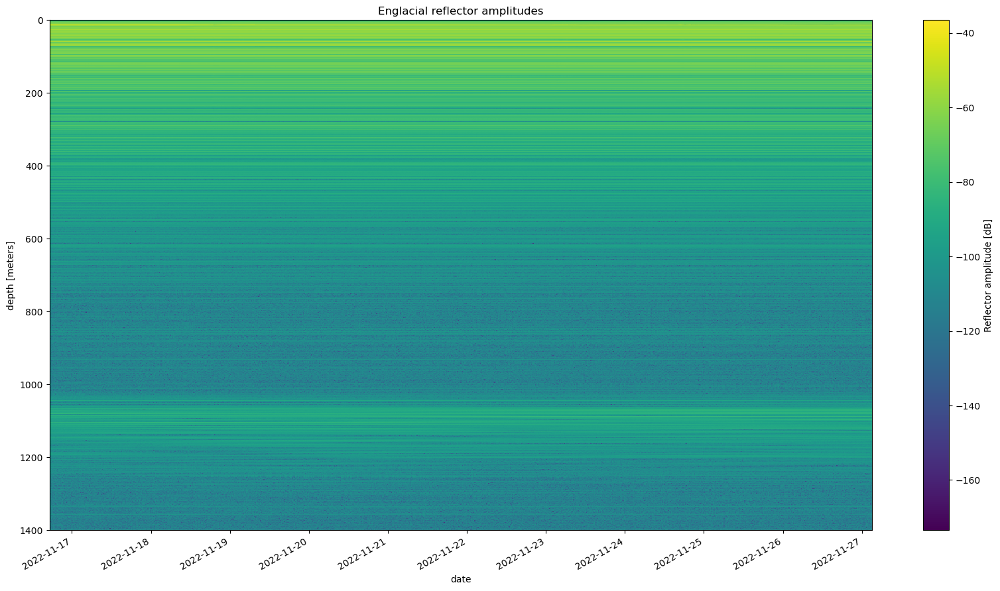

In [21]:
fig, ax = plt.subplots(figsize=(20,10))
xa.dB(ds_101.profile_stacked).plot(ax=ax,x='time',cbar_kwargs={'label':'Reflector amplitude [dB]'})
ax.invert_yaxis()
ax.set_title("Englacial reflector amplitudes")
plt.xlabel('date')


In [22]:
b1= ds_101.profile_stacked.isel(time=range(0,len(ds_101.profile_stacked)-1))
b2 = ds_101.profile_stacked.isel(time=range(1,len(ds_101.profile_stacked)))
b1_dupe = b1.copy()
for i in range(1,len(b1_dupe)):
    b1_dupe[i]= b1[0]



In [23]:
ds_b1, co_b1, phi_b1 = xa.generate_range_diff(b1_dupe,b2,20,20,None,0,0.95)

INFO     14:35:00 	 ApRESDefs.py @function generate_range_diff line 669 - Time between bursts : [900. 901. 900. 901. 899. 900. 900. 900. 900. 900. 900. 900. 908. 892.
 900. 934. 866. 901. 905. 894. 900. 900. 908. 892. 900. 900. 900. 905.
 908. 893. 899. 931. 876. 892. 899. 901. 899. 901. 901. 901. 898. 900.
 940. 860. 898. 902. 901. 900. 900. 907. 898. 902. 901. 892. 900. 900.
 900. 930. 869. 900. 900. 900. 900. 901. 898. 900. 908. 909. 898. 895.
 899. 901. 909. 911. 901. 877. 908. 892. 892. 900. 901. 900. 901. 900.
 899. 900. 900. 902. 900. 900. 904. 895. 899. 900. 901. 900. 899. 900.
 902. 899. 900. 901. 899. 905. 900. 900. 906. 889. 900. 900. 900. 900.
 900. 900. 900. 900. 908. 892. 900. 900. 901. 899. 928. 874. 901. 901.
 908. 892. 899. 901. 910. 889. 900. 901. 900. 899. 909. 891. 928. 871.
 900. 900. 901. 901. 900. 909. 901. 890. 899. 900. 900. 900. 900. 900.
 910. 890. 935. 865. 901. 899. 901. 899. 900. 900. 900. 900. 908. 892.
 900. 900. 917. 883. 901. 903. 905. 919. 871. 900. 9

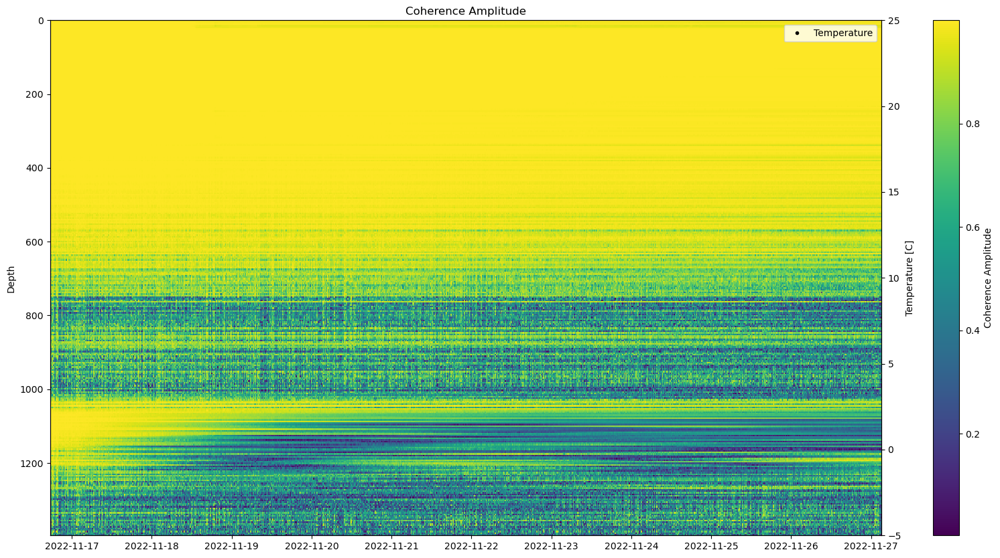

In [24]:
fig, ax = plt.subplots(figsize=(20,10))
temp = ds_101.temperature_2.isel(time=range(1,len(ds_101.temperature_2))).compute()
im = plt.pcolormesh(ds_b1.time,ds_b1.profile_range,abs(co_b1).transpose())
fig.colorbar(im,label='Coherence Amplitude')
ax.invert_yaxis()
ax2 = ax.twinx()
temp.plot(ax=ax2,color='black',linestyle='None',marker='.',label = 'Temperature')
ax2.set_ylabel('Temperature [C]')
ax2.set_title('')
ax2.set_ylim([-5,25])
ax.set_ylabel('Depth')
plt.xlabel('Date')
ax.set_title('Coherence Amplitude')
ax2.legend()

Text(0.5, 0, 'date')

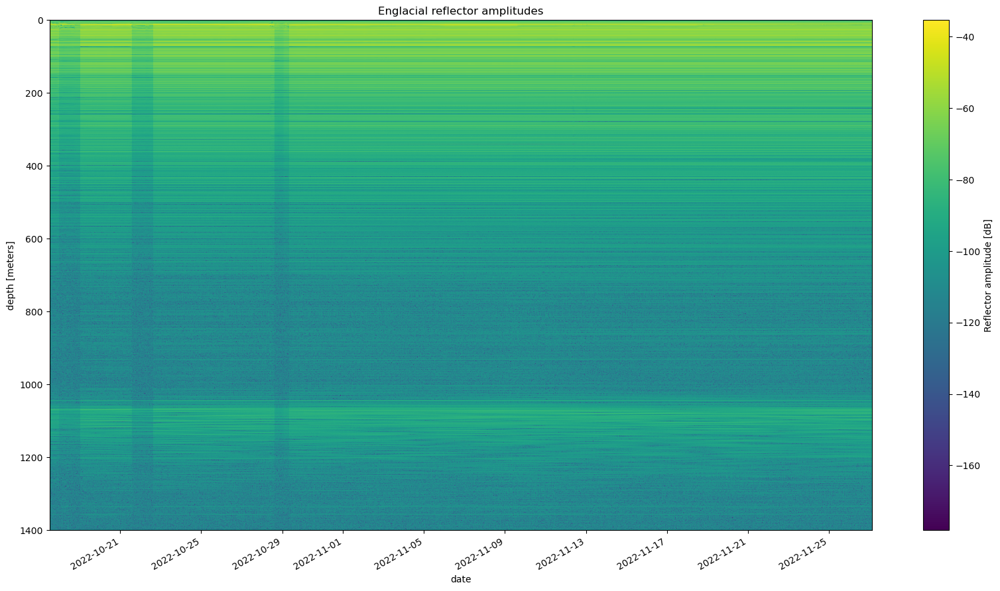

In [25]:
ds_101 = reload_winter("A101").isel(attenuator_setting_pair=1,time=range(2100,6000))
fig, ax = plt.subplots(figsize=(20,10))
xa.dB(ds_101.profile_stacked).plot(ax=ax,x='time',cbar_kwargs={'label':'Reflector amplitude [dB]'})
ax.invert_yaxis()
ax.set_title("Englacial reflector amplitudes")
plt.xlabel('date')


In [26]:
b1= ds_101.profile_stacked.isel(time=range(0,len(ds_101.profile_stacked)-1)).compute()
b2 = ds_101.profile_stacked.isel(time=range(1,len(ds_101.profile_stacked))).compute()
b1_dupe = b1.copy()
for i in range(1,len(b1_dupe)):
    b1_dupe[i]= b1[0]
ds_b1, co_b1, phi_b1 = xa.generate_range_diff(b1_dupe,b2,20,20,None,0,0.95)


INFO     14:36:25 	 ApRESDefs.py @function generate_range_diff line 669 - Time between bursts : [917. 877. 900. ... 900. 932. 866.]s


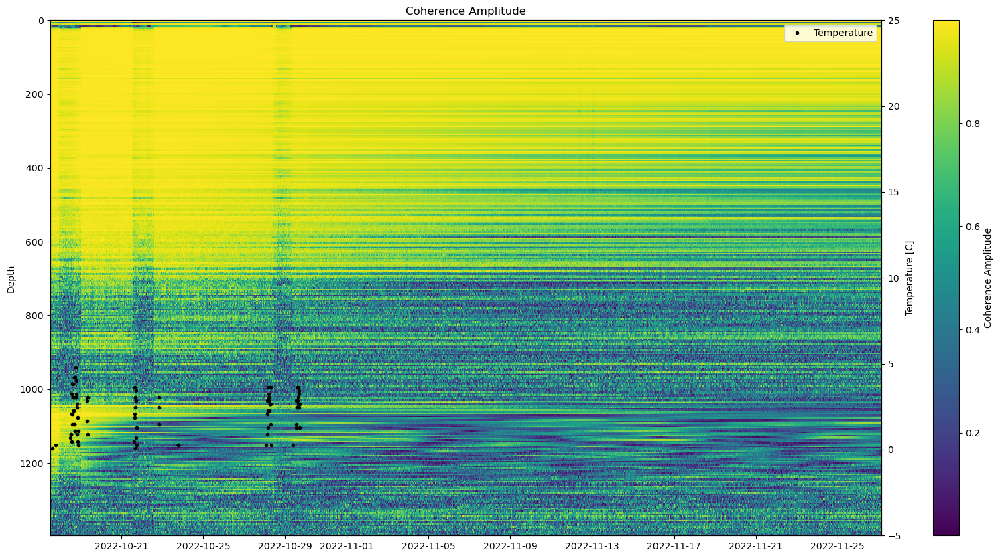

In [27]:
fig, ax = plt.subplots(figsize=(20,10))
temp = ds_101.temperature_2.isel(time=range(1,len(ds_101.temperature_2))).compute()
im = plt.pcolormesh(ds_b1.time,ds_b1.profile_range,abs(co_b1).transpose())
fig.colorbar(im,label='Coherence Amplitude')
ax.invert_yaxis()
ax2 = ax.twinx()
temp.plot(ax=ax2,color='black',linestyle='None',marker='.',label = 'Temperature')
ax2.set_ylabel('Temperature [C]')
ax2.set_title('')
ax2.set_ylim([-5,25])
ax.set_ylabel('Depth')
plt.xlabel('Date')
ax.set_title('Coherence Amplitude')
ax2.legend()

Temperature data looks whack

In [28]:
ds_101_t = reload("A101").isel(attenuator_setting_pair=1).temperature_1.compute()

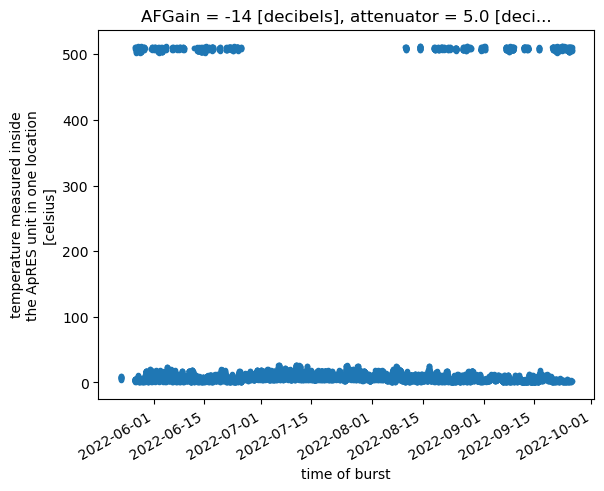

In [29]:
ds_101_t.plot(linestyle='None',marker='.')
#plt.ylim([-50,50])

In [44]:
ds_101_t = reload_winter("A101").isel(attenuator_setting_pair=1).temperature_1.compute()

(-50.0, 50.0)

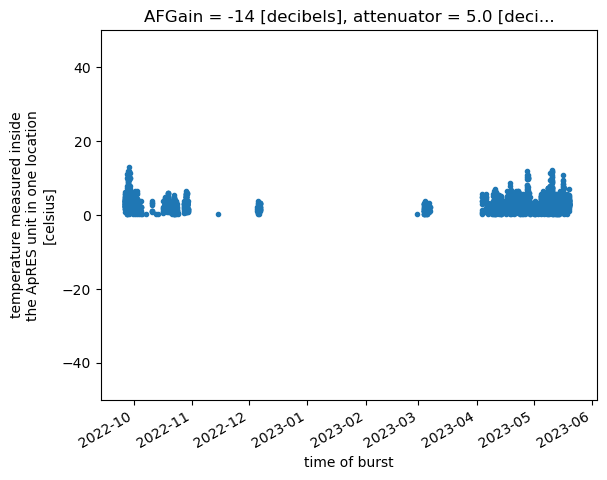

In [45]:
ds_101_t.plot(linestyle='None',marker='.')
plt.ylim([-50,50])

In [31]:
dat_file_list = xa.list_files(directory=f'gs://ldeo-glaciology/GL_apres_2022/A101/winter22_23', 
                remote_load = True)

DEBUG    14:41:11 	 ApRESDefs.py @function list_files line 143 - Find all the dat files in the directory gs://ldeo-glaciology/GL_apres_2022/A101/winter22_23 with remote_load = True
DEBUG    14:41:11 	 ApRESDefs.py @function list_files line 157 - Finish call to list_files. Found 249 files


In [38]:
directory=f"gs://ldeo-glaciology/GL_apres_2022/A101/winter22_23"
xa.load_all(directory, 
                remote_load = True,
                file_names_to_process=dat_file_list[1:2])

DEBUG    14:55:47 	 ApRESDefs.py @function load_all line 191 - Start call to load_all with remote_load = True, directory = gs://ldeo-glaciology/GL_apres_2022/A101/winter22_23, file_numbers_to_process = None, file_names_to_process = ['ldeo-glaciology/GL_apres_2022/A101/winter22_23/DIR2022-09-25-1533/DATA2022-09-25-1533.DAT'], bursts_to_process = All, attended = False
DEBUG    14:55:47 	 ApRESDefs.py @function list_files line 143 - Find all the dat files in the directory gs://ldeo-glaciology/GL_apres_2022/A101/winter22_23 with remote_load = True
DEBUG    14:55:47 	 ApRESDefs.py @function list_files line 157 - Finish call to list_files. Found 249 files
DEBUG    14:55:47 	 ApRESDefs.py @function subset_files line 262 - Subset files to list of files supplied in file_names_to_process
DEBUG    14:55:47 	 ApRESDefs.py @function load_all line 204 - Attended is False, so starting loop over dat files
DEBUG    14:55:47 	 ApRESDefs.py @function load_all line 207 - Load dat file ldeo-glaciology/GL_a

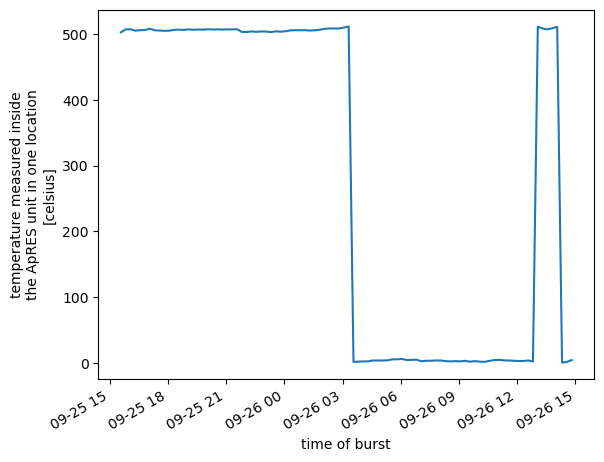

In [40]:
xa.data.temperature_1.plot()